# IT Academy - Data Science with Python
## Sprint 9: Correlation, Feature Scaling & Feature Engineering
### [Github Feature Engineering](https://github.com/jesussantana/Feature-Engineering)

[![forthebadge made-with-python](http://ForTheBadge.com/images/badges/made-with-python.svg)](https://www.python.org/)  
[![Made withJupyter](https://img.shields.io/badge/Made%20with-Jupyter-orange?style=for-the-badge&logo=Jupyter)](https://jupyter.org/)  
[![wakatime](https://wakatime.com/badge/github/jesussantana/Feature-Engineering.svg)](https://wakatime.com/badge/github/jesussantana/Feature-Engineering)

In [1]:
# Data treatment
# ==============================================================================
import numpy as np
import pandas as pd
import datetime
import time
from tabulate import tabulate

# # Graphics
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib.ticker as ticker
import seaborn as sns
%matplotlib inline

# Preprocessing and modeling
# ==============================================================================
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols

from scipy import stats
from scipy.stats import ttest_1samp,ttest_ind
from scipy.stats import normaltest
from scipy.stats import f_oneway
from scipy.stats.mstats import gmean,hmean

from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import make_blobs
from sklearn.metrics import euclidean_distances
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Ridge

from skopt.space import Real, Integer
from skopt.utils import use_named_args
from skopt import gp_minimize
from skopt.plots import plot_convergence

# Various
# ==============================================================================
import multiprocessing
import random
from itertools import product
from fitter import Fitter, get_common_distributions

# Pandas configuration
# ==============================================================================
pd.set_option('display.max_columns', None)

# Matplotlib configuration
# ==============================================================================
plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

# Seaborn configuration
# ==============================================================================
sns.set_theme(style='darkgrid', palette='deep')

# Warnings configuration
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

# Scripts folder configuration
# ==============================================================================
import sys
new_path = '../scripts/'
if new_path not in sys.path:
    sys.path.append(new_path)

### Exercise 1: 
  - Grab a sports-themed dataset that you like and normalize categorical attributes in dummy. Normalize numeric attributes with StandardScaler.

In [2]:
# Path folder configuration
# ===============================================================================

pd.set_option('display.max_columns', None)

path = '../data/'
file = 'raw/MLB_Stats.csv'

df_raw = pd.read_csv(path+file)

In [3]:
df = df_raw.copy()

In [4]:
df.head()

,playerID,Player Name,weight,height,bats,throws,Season,League,teamID,Team,Franchise,G,AB,R,H,2B,3B,HR,RBI,SB,BB,SO,salary,IBB,HBP,SH,SF,PA
0,aardsda01,David Aardsma,215,75,R,R,2004,NL,SFN,San Francisco Giants,San Francisco Giants,11,0,0,0,0,0,0,0,0,0,0,300000,0,0,0,0,0
1,aardsda01,David Aardsma,215,75,R,R,2007,AL,CHA,Chicago White Sox,Chicago White Sox,25,0,0,0,0,0,0,0,0,0,0,387500,0,0,0,0,0
2,aardsda01,David Aardsma,215,75,R,R,2008,AL,BOS,Boston Red Sox,Boston Red Sox,47,1,0,0,0,0,0,0,0,0,1,403250,0,0,0,0,1
3,aardsda01,David Aardsma,215,75,R,R,2009,AL,SEA,Seattle Mariners,Seattle Mariners,73,0,0,0,0,0,0,0,0,0,0,419000,0,0,0,0,0
4,aardsda01,David Aardsma,215,75,R,R,2012,AL,NYA,New York Yankees,New York Yankees,1,0,0,0,0,0,0,0,0,0,0,500000,0,0,0,0,0


In [5]:
df.shape

(28293, 28)

In [6]:
df.describe().round(3)

,weight,height,Season,G,AB,R,H,2B,3B,HR,RBI,SB,BB,SO,salary,IBB,HBP,SH,SF,PA
count,28293.000,28293.000,28293.000,28293.000,28293.000,28293.000,28293.000,28293.000,28293.000,28293.000,28293.000,28293.000,28293.000,28293.000,2.829300e+04,28293.000,28293.000,28293.000,28293.000,28293.000
mean,199.049,73.500,2000.938,63.934,161.880,21.787,42.625,8.221,0.909,4.777,20.784,3.108,15.802,30.376,2.112965e+06,1.326,1.451,1.535,1.367,183.360
std,22.654,2.287,8.901,47.285,199.407,30.134,56.201,11.401,1.832,8.384,29.705,7.495,23.036,37.624,3.440239e+06,3.161,2.782,2.748,2.208,226.217
min,140.000,66.000,1985.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.090000e+04,0.000,0.000,0.000,0.000,0.000
25%,185.000,72.000,1994.000,26.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3.000000e+05,0.000,0.000,0.000,0.000,1.000
50%,195.000,74.000,2001.000,50.000,57.000,4.000,10.000,2.000,0.000,0.000,4.000,0.000,3.000,15.000,6.000000e+05,0.000,0.000,0.000,0.000,66.000
75%,215.000,75.000,2009.000,101.000,298.000,37.000,76.000,14.000,1.000,6.000,34.000,2.000,25.000,50.000,2.425000e+06,1.000,2.000,2.000,2.000,337.000
max,315.000,83.000,2016.000,163.000,716.000,152.000,262.000,59.000,23.000,73.000,165.000,110.000,232.000,223.000,3.300000e+07,120.000,35.000,39.000,17.000,783.000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28293 entries, 0 to 28292
Data columns (total 28 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   playerID     28293 non-null  object
 1   Player Name  28293 non-null  object
 2   weight       28293 non-null  int64 
 3   height       28293 non-null  int64 
 4   bats         28293 non-null  object
 5   throws       28293 non-null  object
 6   Season       28293 non-null  int64 
 7   League       28293 non-null  object
 8   teamID       28293 non-null  object
 9   Team         28293 non-null  object
 10  Franchise    28293 non-null  object
 11  G            28293 non-null  int64 
 12  AB           28293 non-null  int64 
 13  R            28293 non-null  int64 
 14  H            28293 non-null  int64 
 15  2B           28293 non-null  int64 
 16  3B           28293 non-null  int64 
 17  HR           28293 non-null  int64 
 18  RBI          28293 non-null  int64 
 19  SB           28293 non-nu

In [8]:
df = df.drop(['playerID', 'Player Name', 'weight', 'height', 'bats', 'throws', 'Season', 'teamID', 'Franchise' ], axis= 1)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28293 entries, 0 to 28292
Data columns (total 19 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   League  28293 non-null  object
 1   Team    28293 non-null  object
 2   G       28293 non-null  int64 
 3   AB      28293 non-null  int64 
 4   R       28293 non-null  int64 
 5   H       28293 non-null  int64 
 6   2B      28293 non-null  int64 
 7   3B      28293 non-null  int64 
 8   HR      28293 non-null  int64 
 9   RBI     28293 non-null  int64 
 10  SB      28293 non-null  int64 
 11  BB      28293 non-null  int64 
 12  SO      28293 non-null  int64 
 13  salary  28293 non-null  int64 
 14  IBB     28293 non-null  int64 
 15  HBP     28293 non-null  int64 
 16  SH      28293 non-null  int64 
 17  SF      28293 non-null  int64 
 18  PA      28293 non-null  int64 
dtypes: int64(17), object(2)
memory usage: 4.1+ MB


In [10]:
df.Team.unique()

array(['San Francisco Giants', 'Chicago White Sox', 'Boston Red Sox',
       'Seattle Mariners', 'New York Yankees', 'New York Mets',
       'Baltimore Orioles', 'Cincinnati Reds', 'Houston Astros',
       'Oakland Athletics', 'Minnesota Twins', 'Florida Marlins',
       'California Angels', 'Milwaukee Brewers', 'Atlanta Braves',
       'Colorado Rockies', 'Philadelphia Phillies',
       'Tampa Bay Devil Rays', 'Kansas City Royals', 'San Diego Padres',
       'Los Angeles Angels of Anaheim', 'Los Angeles Dodgers',
       'Arizona Diamondbacks', 'Toronto Blue Jays', 'St. Louis Cardinals',
       'Detroit Tigers', 'Cleveland Indians', 'Texas Rangers',
       'Chicago Cubs', 'Montreal Expos', 'Anaheim Angels',
       'Tampa Bay Rays', 'Pittsburgh Pirates', 'Miami Marlins',
       'Washington Nationals'], dtype=object)

In [11]:
df.League.unique()

array(['NL', 'AL'], dtype=object)

## Convert Categorical to Dummies 

In [12]:
# Import script created to transform categorical

import categorical

In [13]:
df_dummies = categorical.transform(df, "League")
df_dummies = categorical.transform(df_dummies, "Team")

In [14]:
df_dummies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28293 entries, 0 to 28292
Data columns (total 54 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   G                                   28293 non-null  int64
 1   AB                                  28293 non-null  int64
 2   R                                   28293 non-null  int64
 3   H                                   28293 non-null  int64
 4   2B                                  28293 non-null  int64
 5   3B                                  28293 non-null  int64
 6   HR                                  28293 non-null  int64
 7   RBI                                 28293 non-null  int64
 8   SB                                  28293 non-null  int64
 9   BB                                  28293 non-null  int64
 10  SO                                  28293 non-null  int64
 11  salary                              28293 non-null  int64
 12  IBB 

## Scaler Numerical

In [15]:
scaler = StandardScaler()

In [16]:
scaler.fit(df_dummies)

StandardScaler()

In [17]:
df_scaler = df_dummies

In [18]:
df_scaler[df_scaler.columns] = scaler.fit_transform(df_scaler[df_scaler.columns])

In [19]:
df_scaler

,G,AB,R,H,2B,3B,HR,RBI,SB,BB,SO,salary,IBB,HBP,SH,SF,PA,League_AL,League_NL,Team_Anaheim Angels,Team_Arizona Diamondbacks,Team_Atlanta Braves,Team_Baltimore Orioles,Team_Boston Red Sox,Team_California Angels,Team_Chicago Cubs,Team_Chicago White Sox,Team_Cincinnati Reds,Team_Cleveland Indians,Team_Colorado Rockies,Team_Detroit Tigers,Team_Florida Marlins,Team_Houston Astros,Team_Kansas City Royals,Team_Los Angeles Angels of Anaheim,Team_Los Angeles Dodgers,Team_Miami Marlins,Team_Milwaukee Brewers,Team_Minnesota Twins,Team_Montreal Expos,Team_New York Mets,Team_New York Yankees,Team_Oakland Athletics,Team_Philadelphia Phillies,Team_Pittsburgh Pirates,Team_San Diego Padres,Team_San Francisco Giants,Team_Seattle Mariners,Team_St. Louis Cardinals,Team_Tampa Bay Devil Rays,Team_Tampa Bay Rays,Team_Texas Rangers,Team_Toronto Blue Jays,Team_Washington Nationals
0,-1.119478,-0.811822,-0.723014,-0.758445,-0.721031,-0.496167,-0.569753,-0.699689,-0.414630,-0.685959,-0.807374,-0.526998,-0.419564,-0.521381,-0.558363,-0.619139,-0.810561,-0.978148,0.978148,-0.094609,-0.145936,-0.188418,-0.191315,-0.197000,-0.117299,-0.190121,-0.186498,-0.19052,-0.193783,-0.16603,-0.186904,-0.150543,-0.183844,-0.190719,-0.111917,-0.196321,-0.069241,-0.187713,-0.180008,-0.148318,-0.190918,-0.194665,-0.191613,-0.193979,-0.191315,-0.191811,5.265345,-0.185175,-0.190818,-0.103871,-0.097051,-0.186904,-0.189321,-0.113365
1,-0.823397,-0.811822,-0.723014,-0.758445,-0.721031,-0.496167,-0.569753,-0.699689,-0.414630,-0.685959,-0.807374,-0.501563,-0.419564,-0.521381,-0.558363,-0.619139,-0.810561,1.022340,-1.022340,-0.094609,-0.145936,-0.188418,-0.191315,-0.197000,-0.117299,-0.190121,5.361976,-0.19052,-0.193783,-0.16603,-0.186904,-0.150543,-0.183844,-0.190719,-0.111917,-0.196321,-0.069241,-0.187713,-0.180008,-0.148318,-0.190918,-0.194665,-0.191613,-0.193979,-0.191315,-0.191811,-0.189921,-0.185175,-0.190818,-0.103871,-0.097051,-0.186904,-0.189321,-0.113365
2,-0.358128,-0.806807,-0.723014,-0.758445,-0.721031,-0.496167,-0.569753,-0.699689,-0.414630,-0.685959,-0.780795,-0.496985,-0.419564,-0.521381,-0.558363,-0.619139,-0.806140,1.022340,-1.022340,-0.094609,-0.145936,-0.188418,-0.191315,5.076147,-0.117299,-0.190121,-0.186498,-0.19052,-0.193783,-0.16603,-0.186904,-0.150543,-0.183844,-0.190719,-0.111917,-0.196321,-0.069241,-0.187713,-0.180008,-0.148318,-0.190918,-0.194665,-0.191613,-0.193979,-0.191315,-0.191811,-0.189921,-0.185175,-0.190818,-0.103871,-0.097051,-0.186904,-0.189321,-0.113365
3,0.191736,-0.811822,-0.723014,-0.758445,-0.721031,-0.496167,-0.569753,-0.699689,-0.414630,-0.685959,-0.807374,-0.492406,-0.419564,-0.521381,-0.558363,-0.619139,-0.810561,1.022340,-1.022340,-0.094609,-0.145936,-0.188418,-0.191315,-0.197000,-0.117299,-0.190121,-0.186498,-0.19052,-0.193783,-0.16603,-0.186904,-0.150543,-0.183844,-0.190719,-0.111917,-0.196321,-0.069241,-0.187713,-0.180008,-0.148318,-0.190918,-0.194665,-0.191613,-0.193979,-0.191315,-0.191811,-0.189921,5.400288,-0.190818,-0.103871,-0.097051,-0.186904,-0.189321,-0.113365
4,-1.330964,-0.811822,-0.723014,-0.758445,-0.721031,-0.496167,-0.569753,-0.699689,-0.414630,-0.685959,-0.807374,-0.468861,-0.419564,-0.521381,-0.558363,-0.619139,-0.810561,1.022340,-1.022340,-0.094609,-0.145936,-0.188418,-0.191315,-0.197000,-0.117299,-0.190121,-0.186498,-0.19052,-0.193783,-0.16603,-0.186904,-0.150543,-0.183844,-0.190719,-0.111917,-0.196321,-0.069241,-0.187713,-0.180008,-0.148318,-0.190918,5.137038,-0.191613,-0.193979,-0.191315,-0.191811,-0.189921,-0.185175,-0.190818,-0.103871,-0.097051,-0.186904,-0.189321,-0.113365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28288,-0.971438,-0.686448,-0.623456,-0.687270,-0.721031,-0.496167,-0.450482,-0.598693,-0.414630,-0.642548,-0.647900,-0.585134,-0.419564,-0.521381,-0.194502,-0.619139,-0.691205,1.022340,-1.022340,-0.094609,-0.145936,-0.188418

### Exercise 2: 
  - Continue with the sports theme data set you like and apply the main component analysis.

- Allows you to visualize a dataframe as a point cloud

In [20]:
pca = PCA(n_components=2)
pca.fit(df_scaler)

PCA(n_components=2)

- How the variables influence each of the var X in the components

In [21]:
print(np.round(pca.components_, 2))  

[[ 0.27  0.29  0.29  0.29  0.28  0.2   0.25  0.28  0.18  0.27  0.27  0.07
   0.2   0.21  0.06  0.24  0.29  0.   -0.    0.    0.    0.   -0.    0.
  -0.   -0.    0.   -0.   -0.    0.    0.   -0.    0.   -0.    0.   -0.
  -0.    0.    0.   -0.   -0.    0.   -0.   -0.   -0.   -0.    0.    0.
   0.   -0.    0.    0.    0.    0.  ]
 [ 0.01  0.   -0.01 -0.   -0.01  0.03 -0.03 -0.02  0.03 -0.    0.01 -0.02
   0.03 -0.01  0.13 -0.02  0.   -0.57  0.57 -0.05  0.08  0.11 -0.11 -0.12
  -0.07  0.11 -0.11  0.11 -0.11  0.09 -0.11  0.08  0.08 -0.11 -0.07  0.11
   0.04  0.02 -0.11  0.09  0.11 -0.12 -0.11  0.11  0.11  0.11  0.11 -0.11
   0.11 -0.06 -0.06 -0.11 -0.11  0.06]]


- Very useful to save memory and create visualizations that could not be done otherwise

In [22]:
pca.explained_variance_ratio_   

array([0.21316203, 0.05641443])

In [23]:
new_values = pca.transform(df_scaler)

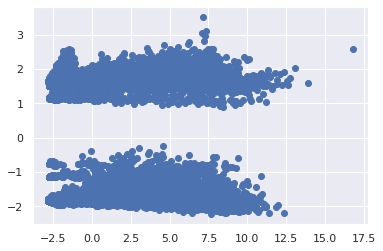

In [24]:
plt.scatter(new_values[:,0], new_values[:,1])

### Exercise 3: 
  - Continue with the sports theme data set you like and normalize the data taking into account the outliers.

In [25]:
df.describe()

,G,AB,R,H,2B,3B,HR,RBI,SB,BB,SO,salary,IBB,HBP,SH,SF,PA
count,28293.000000,28293.000000,28293.000000,28293.000000,28293.000000,28293.000000,28293.000000,28293.000000,28293.000000,28293.000000,28293.000000,2.829300e+04,28293.000000,28293.000000,28293.000000,28293.000000,28293.000000
mean,63.933871,161.879900,21.786838,42.624536,8.220655,0.909165,4.776977,20.783763,3.107518,15.801718,30.376241,2.112965e+06,1.326052,1.450642,1.534549,1.366911,183.359771
std,47.285257,199.406647,30.133899,56.200911,11.401446,1.832408,8.384449,29.704822,7.494805,23.036362,37.624155,3.440239e+06,3.160607,2.782354,2.748349,2.207801,226.217383
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.090000e+04,0.000000,0.000000,0.000000,0.000000,0.000000
25%,26.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000e+05,0.000000,0.000000,0.000000,0.000000,1.000000
50%,50.000000,57.000000,4.000000,10.000000,2.000000,0.000000,0.000000,4.000000,0.000000,3.000000,15.000000,6.000000e+05,0.000000,0.000000,0.000000,0.000000,66.000000
75%,101.000000,298.000000,37.000000,76.000000,14.000000,1.000000,6.000000,34.000000,2.000000,25.000000,50.000000,2.425000e+06,1.000000,2.000000,2.000000,2.000000,337.000000
max,163.000000,716.000000,152.000000,262.000000,59.000000,23.000000,73.000000,165.000000,110.000000,232.000000,223.000000,3.300000e+07,120.000000,35.000000,39.000000,17.000000,783.000000


<AxesSubplot:>

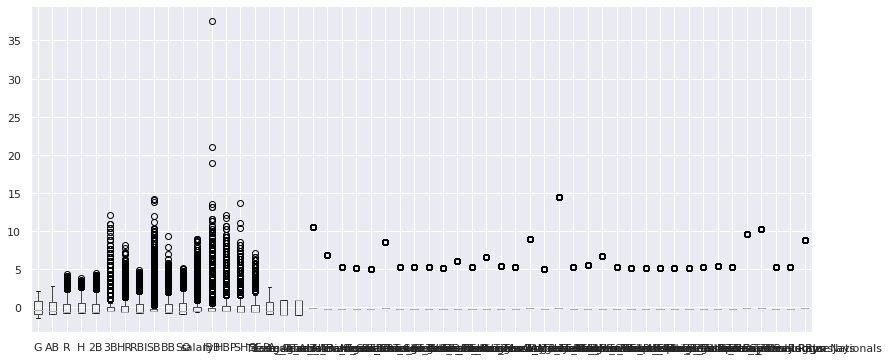

In [26]:
fig, ax=plt.subplots(figsize=(14,6))
df_dummies.boxplot()